<a href="https://colab.research.google.com/github/Prajwalng2/DL-Project/blob/main/DL_project_Chest_xray.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'chest-xray-bsp:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F819353%2F1403233%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240604%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240604T090843Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D38ef0af877d8d415c0c14491a357df05d0a0d553008500e9ae0f5320e3e7bb4d265cfdb8f8e795394e23fc4ba46956e366f5613e9dbf65052c571b49ec9da7b3230390499819b226be89b3d64a0598db5816b84d64e1f54331b8449da6c77b1d1799675af4ef314a44cf55366954416883c8ac5d42d67db5e2230a34b7a9d46f451a4e51bc431f6af3551ded83b672bf1adc82700670a2bcd2443bb2ecd475c8730bc979ed06af340dd445b378984fec25f7ad80c21bf50cea0e4e5ae60a18e067c7670ae691ce5a364c75a19f2c77060904a678412fcdf9a8f986f341861a395eeca8ef14fd4db7bd7d853a600c1e0d18b517c12850348ab25d35c2cc8540e8'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 1504187224 bytes downloaded
Downloaded and uncompressed: chest-xray-bsp
Data source import complete.


In [ ]:
import sys
import os
import random

import numpy as np
import pandas as pd
import cv2
from sklearn.model_selection import KFold
from tqdm import tqdm_notebook as T
import platform

import torch
from torch.utils.data import Dataset
from torch import optim, nn
from torch.nn import functional as F
import torchvision
from torchvision import transforms
from torch.autograd import Variable
from torchvision import transforms

from PIL import Image, ImageFile
from torch.utils.data import Dataset


ImageFile.LOAD_TRUNCATED_IMAGES = True

In [ ]:
data_dir = '../input/chest-xray-bsp/Chest_Xray_BSP'
train_df = pd.read_csv(os.path.join(data_dir, 'train.csv'))
test_df = pd.read_csv(os.path.join(data_dir, 'test.csv'))
train_dir = f'{data_dir}/train/'
test_dir = f'{data_dir}/test/'

In [ ]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

SEED = 24
seed_everything(SEED)

In [ ]:
label_to_idx = {'Normal': 0, 'Viral_Pneumonia': 1, 'Bacterial_Pneumonia': 2, 'Covid': 3}
idx_to_label = {0: 'Normal', 1: 'Viral_Pneumonia', 2: 'Bacterial_Pneumonia', 3: 'Covid'}
train_df['label'] = train_df['Diagnosis'].map(label_to_idx)
test_df['label'] = test_df['Diagnosis'].map(label_to_idx)

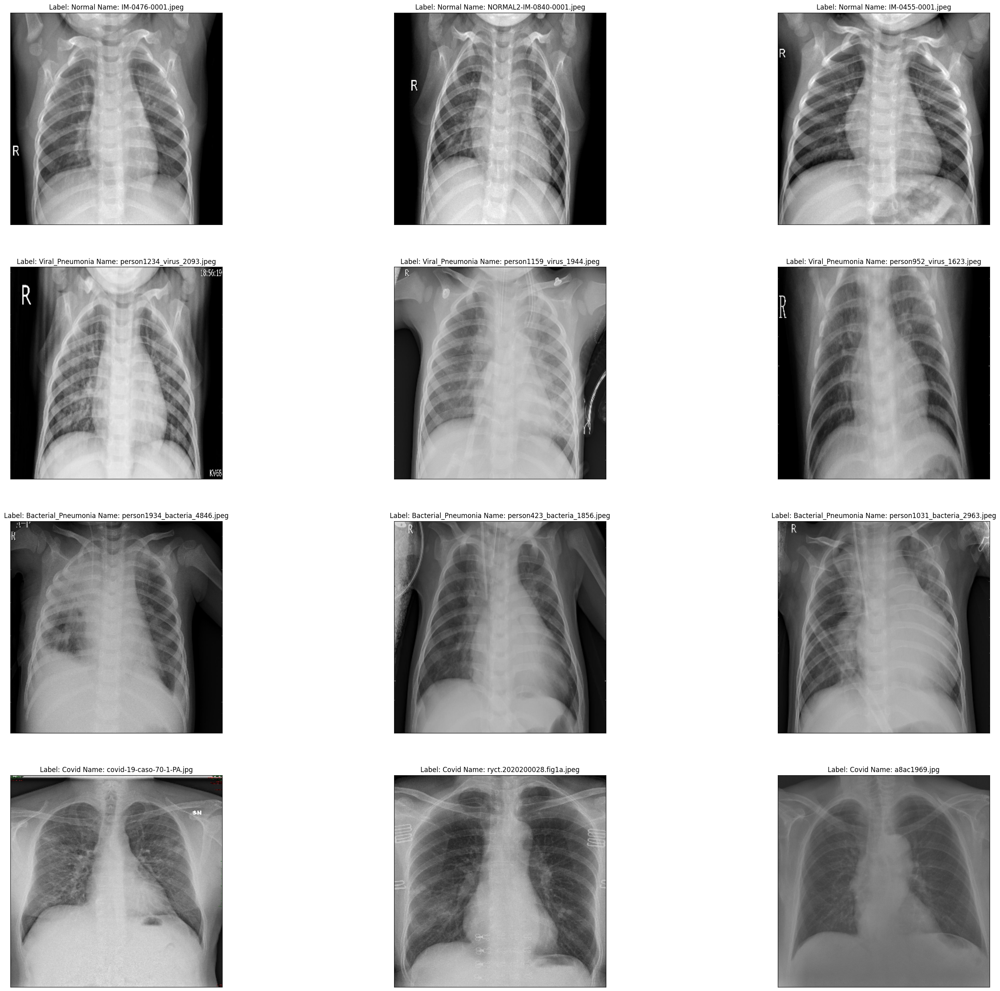

In [ ]:
from matplotlib import pyplot as plt
import os
import random

%matplotlib inline
fig = plt.figure(figsize=(60, 40))
for class_id in sorted(train_df['label'].unique()):
    for i, (idx, row) in enumerate(train_df.loc[train_df['label'] == class_id].sample(3, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"{train_dir}/{row['image_name']}"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (320, 320))
        plt.imshow(image, cmap='bone')
        ax.set_title('Label: %s Name: %s' % (row['Diagnosis'], row['image_name']))

<Axes: >

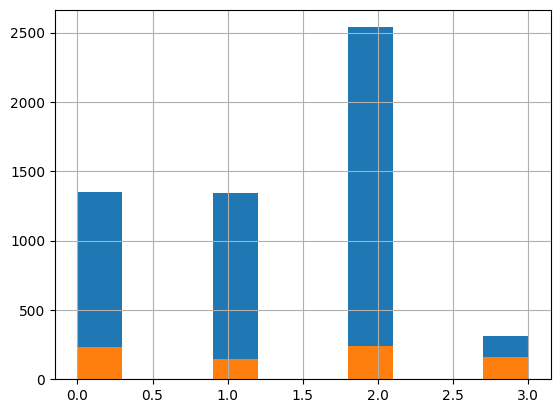

In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline
train_df.label.hist()
test_df.label.hist()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu:0")

In [ ]:
params = {'num_classes':4, 'criterion':nn.BCEWithLogitsLoss(), 'mixed_precision':False,
         'IMG_SIZE':256, 'num_epoch': 16, 'batch_size':32, 'learning_rate':2e-3, 'num_worker':4, 'n_fold':5}

In [ ]:
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold

skf = StratifiedKFold(n_splits=params['n_fold'], shuffle=True, random_state=SEED)
X = train_df['image_name']
y = train_df['label']

for i, (train_index, val_index) in enumerate(skf.split(X, y)):
    train_idx = train_index
    val_idx = val_index
    break

train = train_df.loc[train_idx]
valid = train_df.loc[val_idx]

In [ ]:
class CXRDataset(Dataset):
    def __init__(self, dirname, df, dim, transformer):
        super(Dataset, self).__init__()
        self.data = df
        self.dim = dim
        self.dirname = dirname
        self.transformer = transformer

    def __len__(self):
        return len(self.data)

    def __getitem__(self, item):
        img_name = os.path.join(self.dirname, self.data.loc[item, 'image_name'])
        image = cv2.imread(img_name)
        image = cv2.resize(image, (self.dim, self.dim))
        image = Image.fromarray(image)
        raw_label = [self.data.loc[item, 'label']]

        label = np.zeros((len(raw_label), params['num_classes']))
        label[np.arange(len(raw_label)),raw_label] = 1
        label = torch.LongTensor(label)

        return self.transformer(image), label


In [ ]:
train_transform = transforms.Compose([
    transforms.RandomRotation(360),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
    ])

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
    ])


In [ ]:
class CXRPretrainedModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.resnet50(pretrained=True)
        self.model.fc = nn.Linear(2048, 256)
        self.out = nn.Linear(256, params['num_classes'])

    def forward(self, x):
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.maxpool(x)
        x = self.model.layer1(x)
        x = self.model.layer2(x)
        x = self.model.layer3(x)
        x = self.model.layer4(x)
        x = self.model.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.model.fc(x)
        x = self.out(x)
        return x


In [ ]:
pretrained_model = CXRPretrainedModel().to(device)
criterion = params['criterion']
lr = params['learning_rate']
plist = [
    {'params': pretrained_model.model.parameters(), 'lr':lr/100},
    {'params': pretrained_model.out.parameters(), 'lr':lr}
]
optimizer = optim.Adam(plist, lr=lr)
lr_reduce_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True, threshold=1e-4, threshold_mode='rel', cooldown=0, min_lr=1e-7, eps=1e-08)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 85.6MB/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn

In [ ]:
mixed_precision = params['mixed_precision']
if mixed_precision:
    ! git clone https://github.com/NVIDIA/apex
    os.chdir('apex')
    ! pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./
    os.chdir('../')
    from apex import amp
    amp.initialize(basic_model, optimizer, opt_level='O1')

In [ ]:
def save_model(valid_loss, valid_f1, best_valid_loss, best_valid_f1, best_state, savepath):
    if valid_loss<best_valid_loss:
        print(f'Validation loss has decreased from:  {best_valid_loss:.4f} to: {valid_loss:.4f}. Saving checkpoint')
        torch.save(best_state, savepath+'_loss.pth')
        best_valid_loss = valid_loss
    if valid_f1>best_valid_f1:
        print(f'Validation F1 score has increased from:  {best_valid_f1:.4f} to: {valid_f1:.4f}. Saving checkpoint')
        torch.save(best_state, savepath + '_f1.pth')
        best_valid_f1 = valid_f1
    else:
        torch.save(best_state, savepath + '_last.pth')
    return best_valid_loss, best_valid_f1

In [ ]:
from sklearn.metrics import f1_score

def train_val(epoch, dataloader, model, optimizer, train=True, mode='train'):
    t1 = time.time()
    running_loss = 0
    epoch_samples = 0
    pred = []
    lab = []
    if train:
        model.train()
        print("Initiating train phase ...")
    else:
        model.eval()
        print("Initiating val phase ...")
    for idx, (img,labels) in enumerate(dataloader):
        epoch_samples += img.size(0)
        with torch.set_grad_enabled(train):
            img = img.to(device, dtype=torch.float)
            labels = torch.squeeze(labels).to(device, dtype=torch.float)
            outputs = model(img)
            loss = criterion(outputs, labels)
            running_loss += loss.sum().item()
            if train:
                if mixed_precision:
                    with amp.scale_loss(loss, optimizer) as scaled_loss:
                        scaled_loss.backward()
                else:
                    loss.backward()

                    optimizer.step()
                    optimizer.zero_grad()

        elapsed = int(time.time() - t1)
        eta = int(elapsed / (idx+1) * (len(dataloader)-(idx+1)))
        pred.extend(torch.argmax(outputs, dim=1).detach().cpu().numpy())
        lab.extend(torch.argmax(labels, dim=1).cpu().numpy())

        if train:
            msg = f"Epoch: {epoch} Progress: [{idx}/{len(dataloader)}] loss: {(running_loss/epoch_samples):.4f} Time: {elapsed}s ETA: {eta} s"
        else:
            msg = f'Epoch {epoch} Progress: [{idx}/{len(dataloader)}] loss: {(running_loss/epoch_samples):.4f} Time: {elapsed}s ETA: {eta} s'
        print(msg, end= '\r')
    history.loc[epoch, f'{mode}_loss'] = running_loss/epoch_samples
    history.loc[epoch, f'{mode}_time'] = elapsed
    if mode=='val':
        f1 = f1_score(lab, pred, average='weighted')
        lr_reduce_scheduler.step(running_loss)
        msg = f'{mode} Loss: {running_loss/epoch_samples:.4f} \n {mode} F1 Score: {f1:.4f}'
        print(msg)
        history.loc[epoch, f'{mode}_loss'] = running_loss/epoch_samples
        history.loc[epoch, f'{mode}_f1_score'] = f1
        history.to_csv(f'history.csv', index=False)
        return lab, pred, running_loss/epoch_samples, f1
    elif mode == 'test':
        f1 = f1_score(lab, pred, average='weighted')
        return lab, pred, running_loss/epoch_samples, f1
    else:
        return model

In [ ]:
train_dataset = CXRDataset(train_dir, train.reset_index(drop=True), params['IMG_SIZE'], train_transform)
train_data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True, num_workers=4)
val_dataset = CXRDataset(train_dir, valid.reset_index(drop=True), params['IMG_SIZE'], val_transform)
val_data_loader = torch.utils.data.DataLoader(val_dataset, batch_size=params['batch_size']//2, shuffle=True,num_workers= params['num_worker'])
test_dataset = CXRDataset(test_dir, test_df.reset_index(drop=True), params['IMG_SIZE'], val_transform)
test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=params['batch_size']//2, shuffle=True,num_workers= params['num_worker'])

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
import gc
import time

def main(model):
    prev_epoch_num = 0
    best_valid_loss = np.inf
    best_valid_f1 = 0.0

    for epoch in range(params['num_epoch']):
        torch.cuda.empty_cache()
        print(gc.collect())

        model = train_val(epoch, train_data_loader, model=model, optimizer=optimizer, train=True, mode='train')
        _, _, valid_loss, valid_f1 = train_val(epoch, val_data_loader, model=model, optimizer=optimizer, train=False, mode='val')
        print("#"*20)
        print(f"Epoch {epoch} Report:")
        print(f"Validation Loss: {valid_loss :.4f} Validation F1 Score: {valid_f1 :.4f}")
        best_state = {'model': model.state_dict(), 'optim': optimizer.state_dict(), 'scheduler':lr_reduce_scheduler.state_dict(),


        'best_loss':valid_loss, 'best_f1':valid_f1, 'epoch':epoch}
        best_valid_loss, best_valid_f1 = save_model(valid_loss, valid_f1, best_valid_loss, best_valid_f1, best_state, './CXR_model')
        print("#"*20)

In [ ]:
if mixed_precision:
    amp.initialize(pretrained_model, optimizer, opt_level='O1')

In [ ]:
history = pd.DataFrame()
main(pretrained_model)

55
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


val Loss: 0.0154 
 val F1 Score: 0.7807
####################
Epoch 0 Report:
Validation Loss: 0.0154 Validation F1 Score: 0.7807
Validation loss has decreased from:  inf to: 0.0154. Saving checkpoint
Validation F1 score has increased from:  0.0000 to: 0.7807. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0168 
 val F1 Score: 0.7824
####################
Epoch 1 Report:
Validation Loss: 0.0168 Validation F1 Score: 0.7824
Validation F1 score has increased from:  0.7807 to: 0.7824. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0143 
 val F1 Score: 0.7889
####################
Epoch 2 Report:
Validation Loss: 0.0143 Validation F1 Score: 0.7889
Validation loss has decreased from:  0.0154 to: 0.0143. Saving checkpoint
Validation F1 score has increased from:  0.7824 to: 0.7889. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0131 
 val F1 Score: 0.8223
####################
Epoch 3 Report:
Validation Loss: 0.0131 Validation F1 Score: 0.8223
Validation loss has decreased from:  0.0143 to: 0.0131. Saving checkpoint
Validation F1 score has increased from:  0.7889 to: 0.8223. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0129 
 val F1 Score: 0.8102
####################
Epoch 4 Report:
Validation Loss: 0.0129 Validation F1 Score: 0.8102
Validation loss has decreased from:  0.0131 to: 0.0129. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0140 
 val F1 Score: 0.7943
####################
Epoch 5 Report:
Validation Loss: 0.0140 Validation F1 Score: 0.7943
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0127 
 val F1 Score: 0.8121
####################
Epoch 6 Report:
Validation Loss: 0.0127 Validation F1 Score: 0.8121
Validation loss has decreased from:  0.0129 to: 0.0127. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0121 
 val F1 Score: 0.8250
####################
Epoch 7 Report:
Validation Loss: 0.0121 Validation F1 Score: 0.8250
Validation loss has decreased from:  0.0127 to: 0.0121. Saving checkpoint
Validation F1 score has increased from:  0.8223 to: 0.8250. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0119 
 val F1 Score: 0.8346
####################
Epoch 8 Report:
Validation Loss: 0.0119 Validation F1 Score: 0.8346
Validation loss has decreased from:  0.0121 to: 0.0119. Saving checkpoint
Validation F1 score has increased from:  0.8250 to: 0.8346. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0121 
 val F1 Score: 0.8221
####################
Epoch 9 Report:
Validation Loss: 0.0121 Validation F1 Score: 0.8221
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0124 
 val F1 Score: 0.8177
####################
Epoch 10 Report:
Validation Loss: 0.0124 Validation F1 Score: 0.8177
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0125 
 val F1 Score: 0.8145
####################
Epoch 11 Report:
Validation Loss: 0.0125 Validation F1 Score: 0.8145
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0131 
 val F1 Score: 0.8245
####################
Epoch 12 Report:
Validation Loss: 0.0131 Validation F1 Score: 0.8245
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0115 
 val F1 Score: 0.8385
####################
Epoch 13 Report:
Validation Loss: 0.0115 Validation F1 Score: 0.8385
Validation loss has decreased from:  0.0119 to: 0.0115. Saving checkpoint
Validation F1 score has increased from:  0.8346 to: 0.8385. Saving checkpoint
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0127 
 val F1 Score: 0.8057
####################
Epoch 14 Report:
Validation Loss: 0.0127 Validation F1 Score: 0.8057
####################
0
Initiating train phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Initiating val phase ...
val Loss: 0.0113 
 val F1 Score: 0.8405
####################
Epoch 15 Report:
Validation Loss: 0.0113 Validation F1 Score: 0.8405
Validation loss has decreased from:  0.0115 to: 0.0113. Saving checkpoint
Validation F1 score has increased from:  0.8385 to: 0.8405. Saving checkpoint
####################


In [ ]:
tmp = torch.load('./CXR_model_f1.pth')
print('Model loaded')

pretrained_model.load_state_dict(tmp['model'])
predictions, actual_labels, test_loss, test_f1 = train_val(-1, test_data_loader, model=pretrained_model, optimizer=optimizer, train=False, mode='test')
print(f'Test Loss: {test_loss} Test F1: {test_f1}')

Model loaded
Initiating val phase ...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Test Loss: 0.01646892942146075 Test F1: 0.807080578173704


In [ ]:
predictions = [idx_to_label[p] for p in predictions]
actual_labels = [idx_to_label[p] for p in actual_labels]

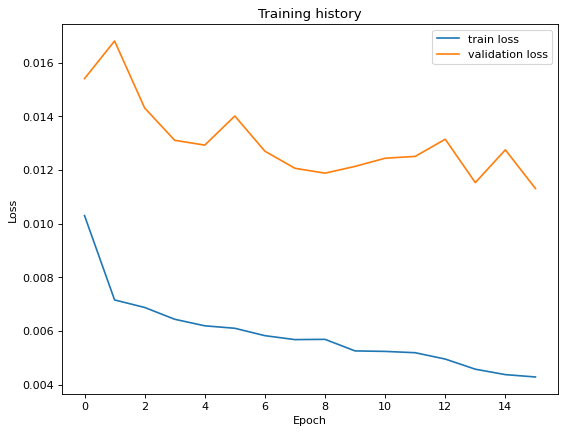

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
figure(num=None, figsize=(8, 6), dpi=80, edgecolor='k')
history = pd.read_csv('./history.csv')
plt.plot(history['train_loss'], label='train loss')
plt.plot(history['val_loss'], label='validation loss')

plt.title('Training history')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

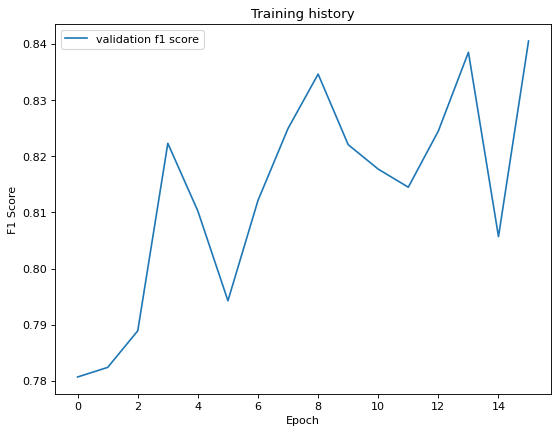

In [ ]:
figure(num=None, figsize=(8, 6), dpi=80, facecolor='1', edgecolor='k')
plt.plot(history['val_f1_score'], label='validation f1 score')

plt.title('Training history')
plt.ylabel('F1 Score')
plt.xlabel('Epoch')
plt.legend()

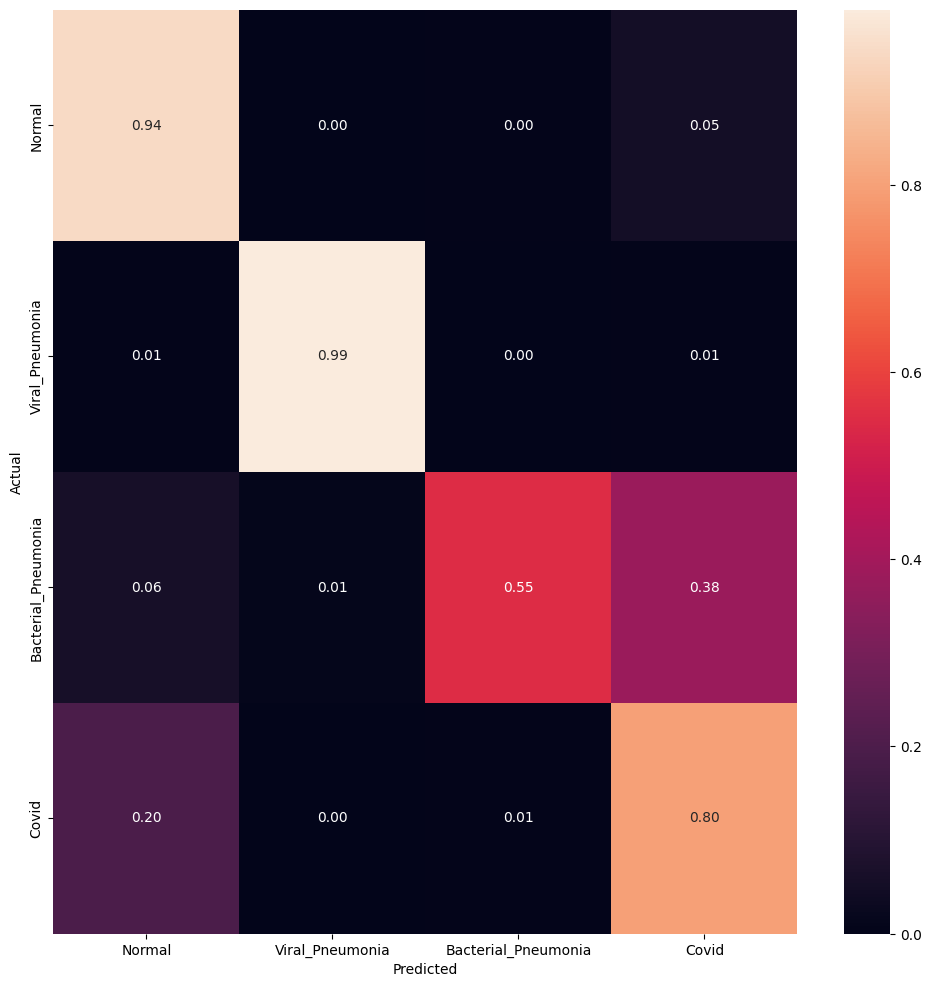

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
labels = list(idx_to_label.values())
cm = confusion_matrix(predictions, actual_labels)

cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(12,12))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [ ]:
! pip install -q pytorch-gradcam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 14.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from gradcam import GradCAM, GradCAMpp
from gradcam.utils import visualize_cam

def grad_cam_gen(model, img, mixed_precision = False, device = 'cuda'):
    if mixed_precision:
        model, optim = amp.initialize(model, optim, opt_level='O1')

    configs = [dict(model_type='resnet', arch=model, layer_name='layer4')]
    for config in configs:
        config['arch'].to(device).eval()

    cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
        for config in configs]

    for _, gradcam_pp in cams:
        mask_pp, _ = gradcam_pp(img)
        heatmap_pp, result_pp = visualize_cam(mask_pp, img)
        result_pp = result_pp.cpu().numpy()

        result_pp = np.transpose(result_pp, (1,2,0))
        return result_pp

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1373: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3809: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


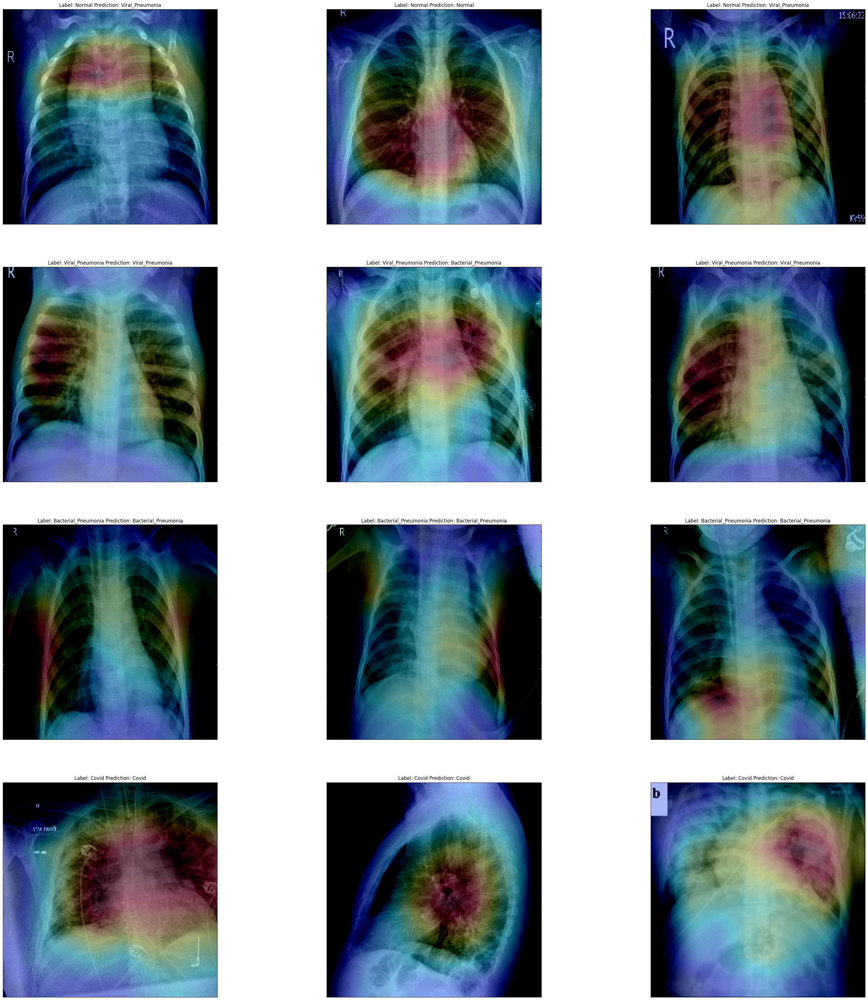

In [ ]:
from torchvision import models

%matplotlib inline
fig = plt.figure(figsize=(70, 56))
for class_id in sorted(test_df['label'].unique()):
    for i, (idx, row) in enumerate(test_df.loc[test_df['label'] == class_id].sample(3, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"{test_dir}/{row['image_name']}"
        image = cv2.imread(path)
        image = cv2.resize(image, (256, 256))
        image = Image.fromarray(image)
        image = val_transform(image)
        prediction = torch.argmax(pretrained_model(torch.unsqueeze(image.to(device), dim=0)))
        prediction = prediction.data.cpu().numpy()
        pred_label = idx_to_label[int(prediction)]
        image = grad_cam_gen(pretrained_model.model, torch.unsqueeze(image, dim=0).cuda())
        plt.imshow(image, cmap='bone')
        ax.set_title('Label: %s Prediction: %s' % (row['Diagnosis'], pred_label))